<a href="https://colab.research.google.com/github/9-coding/ComputerVision_TeamProject/blob/main/ActiveLearning2_modelCompare_rfz_resnet50_d.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/gdrive/')




Mounted at /content/gdrive/


In [2]:
import os
# 각자 환경에서 이 부분만 변경하여 사용하면 됩니다.
os.chdir('/content/gdrive/MyDrive/CUB_200_2011_repackage_class50')
print(os.getcwd())


/content/gdrive/MyDrive/CUB_200_2011_repackage_class50


In [3]:
!pip install wandb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 25.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 kB 29.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.9/243.9 kB 39.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 10.9 MB/s eta 0:00:00


In [4]:
!wandb login f9fc6c65de4904021a59f4c8c60b90961f6ec1fb

wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


In [5]:
!pip install timm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 14.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 17.1 MB/s eta 0:00:00


In [7]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import time
import torch
import torchvision.transforms as transforms
import torchvision.models as models
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, ConcatDataset
from PIL import Image
import random
import timm

### wandb ###
import wandb
wandb.init(project='ActiveLearning2_modelCompare')

def set_seed(seed: int = 42) -> None:
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    # When running on the CuDNN backend, two further options must be set
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    # Set a fixed value for the hash seed
    os.environ["PYTHONHASHSEED"] = str(seed)
    print(f"Random seed set as {seed}")

set_seed(42)


### GPU Setting ###
USE_CUDA = torch.cuda.is_available()
DEVICE = torch.device("cuda" if USE_CUDA else "cpu")
print(DEVICE)

### Custom Dataset ###
class CUB2011(Dataset):
    def __init__(self, transform, mode='train'):
        self.transform = transform
        self.mode = mode
        self.image_folder = os.listdir(f'./datasets/{mode}')

    def __len__(self):
        return len(self.image_folder)

    def __getitem__(self, idx):
        img_path = self.image_folder[idx]
        img = Image.open(os.path.join('./datasets', self.mode, img_path)).convert('RGB')
        img = self.transform(img)
        label = int(img_path.split('_')[-1].split('.')[0])
        return (img, label)

wandb: Currently logged in as: kdy1021 (computervisionactivelearning). Use `wandb login --relogin` to force relogin


Random seed set as 42
cuda


In [8]:
### Data Augmentation ###
def transforms_func(transform):
  return transforms.Compose([
    transforms.Resize((448, 448)),
    transform,
    transforms.ToTensor(),
])

def transforms_resize_func(resize):
  return transforms.Compose([
    resize,
    transforms.ToTensor(),
])

ROTATION_DEGREE = 30
zoom_scale = (0.8, 1.2)
transforms_rotation = transforms_func(transforms.RandomRotation(degrees=ROTATION_DEGREE))
transforms_horizontal_flip = transforms_func(transforms.RandomHorizontalFlip(p=1.0))
transforms_zoom = transforms_func(transforms.RandomResizedCrop(448, scale=zoom_scale))

transforms_train = transforms_resize_func(transforms.Resize((448, 448)))
transforms_valtest = transforms_resize_func(transforms.Resize((448, 448)))
transforms_random_resized_crop = transforms_resize_func(transforms.RandomResizedCrop(448, scale=(0.8, 1.0)))

In [12]:
BATCH_SIZE = 32
train_set_with_augmentation = CUB2011(mode='train', transform=transforms_train)

train_set_randomcrop = CUB2011(mode='train', transform=transforms_random_resized_crop)
train_set_rotation = CUB2011(mode='train', transform=transforms_rotation)
train_set_horizontal_flip = CUB2011(mode='train', transform=transforms_horizontal_flip)
train_set_zoom = CUB2011(mode='train', transform=transforms_zoom)

#===============
combined_train_set = ConcatDataset([train_set_with_augmentation, train_set_horizontal_flip, train_set_rotation, train_set_zoom])



val_set = CUB2011(mode='valid', transform=transforms_valtest)
test_set = CUB2011(mode='test', transform=transforms_valtest)

train_loader = DataLoader(combined_train_set, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_set, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_set, batch_size=BATCH_SIZE, shuffle=False)

In [16]:

### Model / Optimizer ###
EPOCH = 15
lr = 0.1
model_name = 'resnet50d'
model = timm.create_model(model_name, pretrained=True)
num_features = model.fc.in_features

# Adjusting for augmentation
model.fc = nn.Linear(num_features, 50)
model = model.to(DEVICE)
optimizer = optim.SGD(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)
# model.load_state_dict(torch.load('/content/gdrive/MyDrive/best_model_with_augmentation_resnet_d.pth'))

Train Epoch 0 [0/295]	Loss: 3.916532
Train Epoch 0 [30/295]	Loss: 3.636372
Train Epoch 0 [60/295]	Loss: 3.190475
Train Epoch 0 [90/295]	Loss: 1.751867
Train Epoch 0 [120/295]	Loss: 1.055303
Train Epoch 0 [150/295]	Loss: 0.707388
Train Epoch 0 [180/295]	Loss: 0.714648
Train Epoch 0 [210/295]	Loss: 0.501298
Train Epoch 0 [240/295]	Loss: 0.180178
Train Epoch 0 [270/295]	Loss: 0.270758


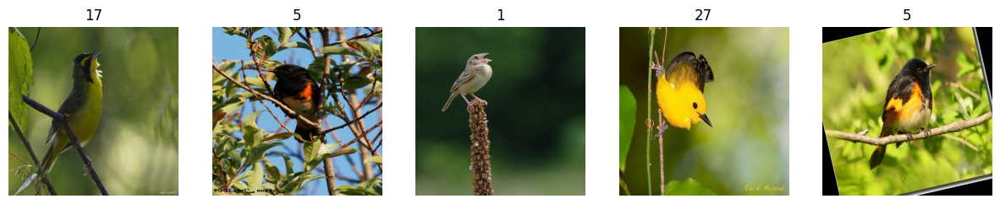

Epoch 0
Train Loss: 0.1691, Validation Loss: 0.2697, Validation Accuracy: 91.89%

Train Epoch 1 [0/295]	Loss: 0.233124
Train Epoch 1 [30/295]	Loss: 0.126281
Train Epoch 1 [60/295]	Loss: 0.081422
Train Epoch 1 [90/295]	Loss: 0.109257
Train Epoch 1 [120/295]	Loss: 0.057483
Train Epoch 1 [150/295]	Loss: 0.073017
Train Epoch 1 [180/295]	Loss: 0.034799
Train Epoch 1 [210/295]	Loss: 0.041117
Train Epoch 1 [240/295]	Loss: 0.143062
Train Epoch 1 [270/295]	Loss: 0.087651


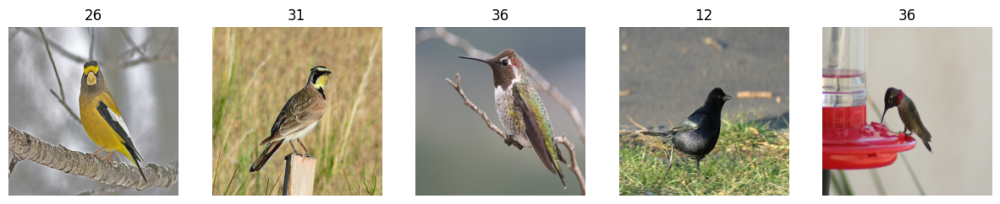

Epoch 1
Train Loss: 0.0249, Validation Loss: 0.2066, Validation Accuracy: 96.28%

Train Epoch 2 [0/295]	Loss: 0.015765
Train Epoch 2 [30/295]	Loss: 0.022897
Train Epoch 2 [60/295]	Loss: 0.014266
Train Epoch 2 [90/295]	Loss: 0.020290
Train Epoch 2 [120/295]	Loss: 0.057835
Train Epoch 2 [150/295]	Loss: 0.012096
Train Epoch 2 [180/295]	Loss: 0.032485
Train Epoch 2 [210/295]	Loss: 0.023517
Train Epoch 2 [240/295]	Loss: 0.027876
Train Epoch 2 [270/295]	Loss: 0.029588


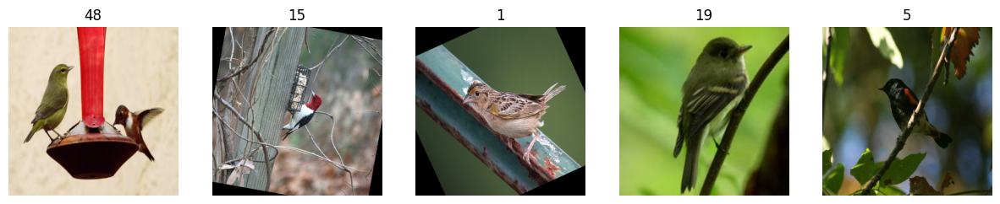

Epoch 2
Train Loss: 0.0088, Validation Loss: 0.1968, Validation Accuracy: 96.28%

Train Epoch 3 [0/295]	Loss: 0.015097
Train Epoch 3 [30/295]	Loss: 0.005436
Train Epoch 3 [60/295]	Loss: 0.011974
Train Epoch 3 [90/295]	Loss: 0.012463
Train Epoch 3 [120/295]	Loss: 0.036779
Train Epoch 3 [150/295]	Loss: 0.004811
Train Epoch 3 [180/295]	Loss: 0.009053
Train Epoch 3 [210/295]	Loss: 0.005881
Train Epoch 3 [240/295]	Loss: 0.032142
Train Epoch 3 [270/295]	Loss: 0.007708


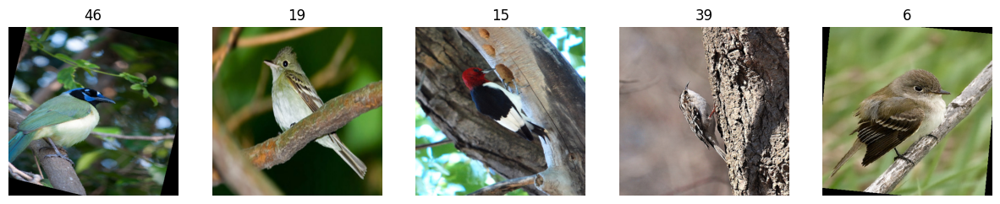

Epoch 3
Train Loss: 0.0245, Validation Loss: 0.1893, Validation Accuracy: 95.27%

Train Epoch 4 [0/295]	Loss: 0.020658
Train Epoch 4 [30/295]	Loss: 0.014056
Train Epoch 4 [60/295]	Loss: 0.006003
Train Epoch 4 [90/295]	Loss: 0.006229
Train Epoch 4 [120/295]	Loss: 0.008744
Train Epoch 4 [150/295]	Loss: 0.003365
Train Epoch 4 [180/295]	Loss: 0.012793
Train Epoch 4 [210/295]	Loss: 0.006810
Train Epoch 4 [240/295]	Loss: 0.007721
Train Epoch 4 [270/295]	Loss: 0.003840


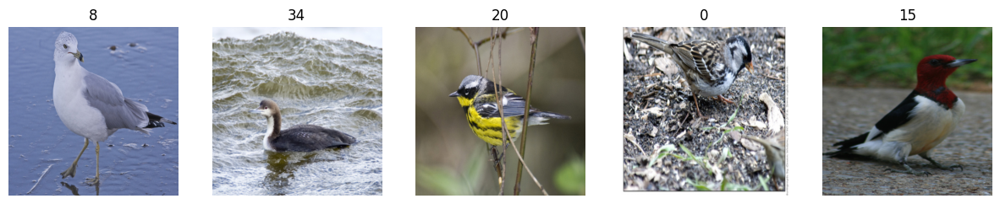

Epoch 4
Train Loss: 0.0053, Validation Loss: 0.1857, Validation Accuracy: 95.61%

Train Epoch 5 [0/295]	Loss: 0.004077
Train Epoch 5 [30/295]	Loss: 0.001561
Train Epoch 5 [60/295]	Loss: 0.015297
Train Epoch 5 [90/295]	Loss: 0.001622
Train Epoch 5 [120/295]	Loss: 0.003613
Train Epoch 5 [150/295]	Loss: 0.004627
Train Epoch 5 [180/295]	Loss: 0.005379
Train Epoch 5 [210/295]	Loss: 0.008757
Train Epoch 5 [240/295]	Loss: 0.013174
Train Epoch 5 [270/295]	Loss: 0.004988


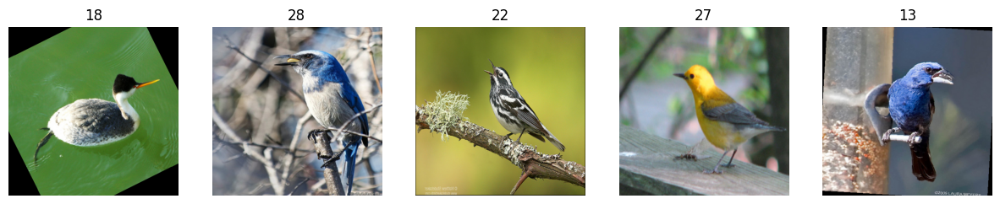

Epoch 5
Train Loss: 0.0053, Validation Loss: 0.1965, Validation Accuracy: 95.61%

Train Epoch 6 [0/295]	Loss: 0.022778
Train Epoch 6 [30/295]	Loss: 0.002664
Train Epoch 6 [60/295]	Loss: 0.007102
Train Epoch 6 [90/295]	Loss: 0.017314
Train Epoch 6 [120/295]	Loss: 0.003570
Train Epoch 6 [150/295]	Loss: 0.002277
Train Epoch 6 [180/295]	Loss: 0.001383
Train Epoch 6 [210/295]	Loss: 0.004177
Train Epoch 6 [240/295]	Loss: 0.001670
Train Epoch 6 [270/295]	Loss: 0.002554


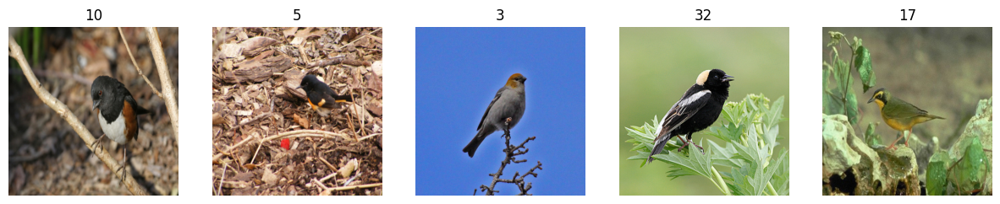

Epoch 6
Train Loss: 0.0065, Validation Loss: 0.1953, Validation Accuracy: 95.27%

Train Epoch 7 [0/295]	Loss: 0.001248
Train Epoch 7 [30/295]	Loss: 0.004579
Train Epoch 7 [60/295]	Loss: 0.002789
Train Epoch 7 [90/295]	Loss: 0.003937
Train Epoch 7 [120/295]	Loss: 0.001379
Train Epoch 7 [150/295]	Loss: 0.008601
Train Epoch 7 [180/295]	Loss: 0.006102
Train Epoch 7 [210/295]	Loss: 0.034160
Train Epoch 7 [240/295]	Loss: 0.008426
Train Epoch 7 [270/295]	Loss: 0.002832


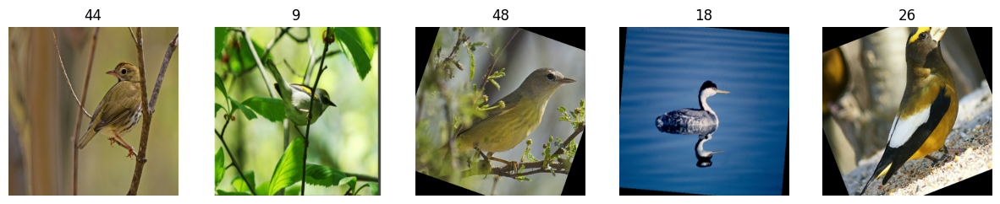

Epoch 7
Train Loss: 0.0020, Validation Loss: 0.1942, Validation Accuracy: 95.95%

Train Epoch 8 [0/295]	Loss: 0.001619
Train Epoch 8 [30/295]	Loss: 0.004686
Train Epoch 8 [60/295]	Loss: 0.001208
Train Epoch 8 [90/295]	Loss: 0.004505
Train Epoch 8 [120/295]	Loss: 0.002409
Train Epoch 8 [150/295]	Loss: 0.003737
Train Epoch 8 [180/295]	Loss: 0.001238
Train Epoch 8 [210/295]	Loss: 0.000985
Train Epoch 8 [240/295]	Loss: 0.001281
Train Epoch 8 [270/295]	Loss: 0.008805


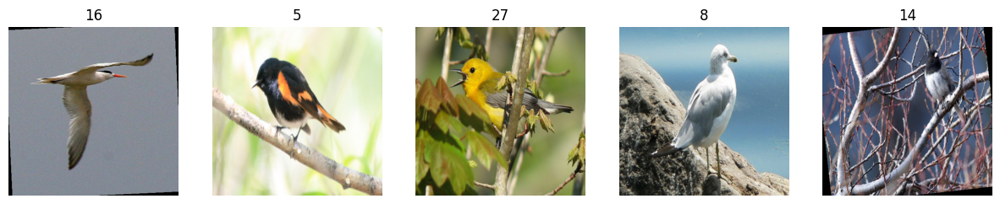

Epoch 8
Train Loss: 0.0050, Validation Loss: 0.2038, Validation Accuracy: 95.27%

Train Epoch 9 [0/295]	Loss: 0.002203
Train Epoch 9 [30/295]	Loss: 0.001134
Train Epoch 9 [60/295]	Loss: 0.001177
Train Epoch 9 [90/295]	Loss: 0.001817
Train Epoch 9 [120/295]	Loss: 0.004998
Train Epoch 9 [150/295]	Loss: 0.004033
Train Epoch 9 [180/295]	Loss: 0.002167
Train Epoch 9 [210/295]	Loss: 0.002200
Train Epoch 9 [240/295]	Loss: 0.000938
Train Epoch 9 [270/295]	Loss: 0.001789


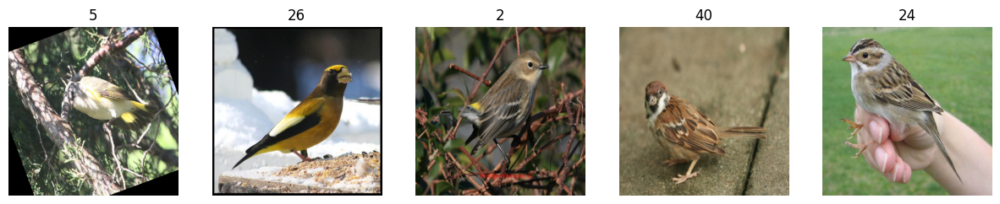

Epoch 9
Train Loss: 0.0031, Validation Loss: 0.2084, Validation Accuracy: 95.27%

Train Epoch 10 [0/295]	Loss: 0.004891
Train Epoch 10 [30/295]	Loss: 0.000818
Train Epoch 10 [60/295]	Loss: 0.001243
Train Epoch 10 [90/295]	Loss: 0.006098
Train Epoch 10 [120/295]	Loss: 0.002558
Train Epoch 10 [150/295]	Loss: 0.003776
Train Epoch 10 [180/295]	Loss: 0.001740
Train Epoch 10 [210/295]	Loss: 0.002194
Train Epoch 10 [240/295]	Loss: 0.001479
Train Epoch 10 [270/295]	Loss: 0.000780


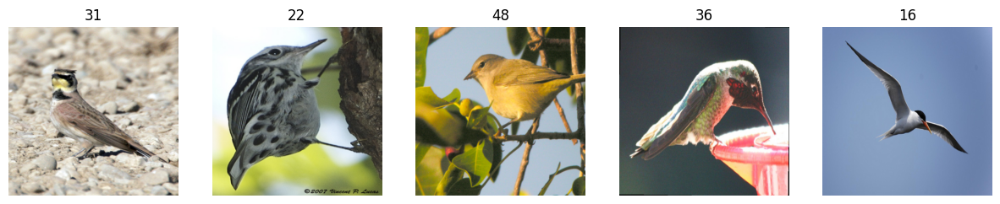

Epoch 10
Train Loss: 0.0017, Validation Loss: 0.1877, Validation Accuracy: 95.27%

Train Epoch 11 [0/295]	Loss: 0.003845
Train Epoch 11 [30/295]	Loss: 0.011687
Train Epoch 11 [60/295]	Loss: 0.001762
Train Epoch 11 [90/295]	Loss: 0.001657
Train Epoch 11 [120/295]	Loss: 0.002300
Train Epoch 11 [150/295]	Loss: 0.002682
Train Epoch 11 [180/295]	Loss: 0.001643
Train Epoch 11 [210/295]	Loss: 0.005364
Train Epoch 11 [240/295]	Loss: 0.001365
Train Epoch 11 [270/295]	Loss: 0.001913


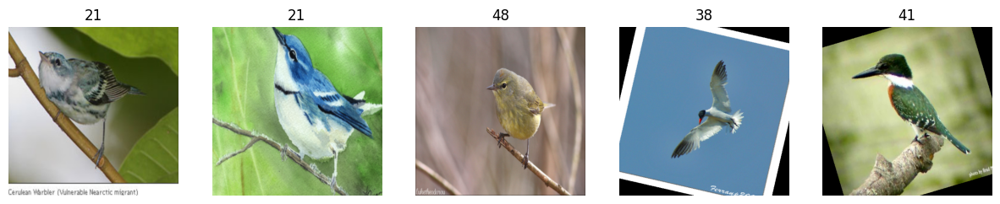

Epoch 11
Train Loss: 0.0027, Validation Loss: 0.1770, Validation Accuracy: 95.61%

Train Epoch 12 [0/295]	Loss: 0.002174
Train Epoch 12 [30/295]	Loss: 0.001356
Train Epoch 12 [60/295]	Loss: 0.003045
Train Epoch 12 [90/295]	Loss: 0.000962
Train Epoch 12 [120/295]	Loss: 0.006102
Train Epoch 12 [150/295]	Loss: 0.001373
Train Epoch 12 [180/295]	Loss: 0.002625
Train Epoch 12 [210/295]	Loss: 0.001921
Train Epoch 12 [240/295]	Loss: 0.001592
Train Epoch 12 [270/295]	Loss: 0.000823


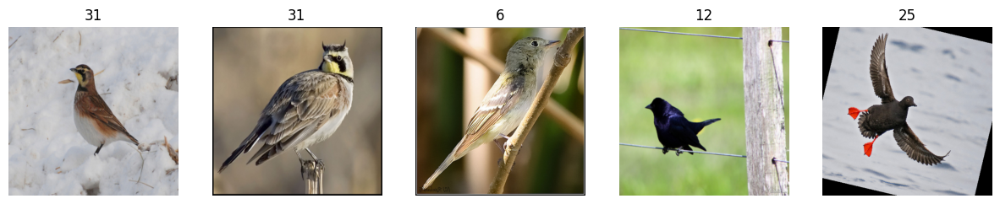

Epoch 12
Train Loss: 0.0009, Validation Loss: 0.1842, Validation Accuracy: 95.27%

Train Epoch 13 [0/295]	Loss: 0.001367
Train Epoch 13 [30/295]	Loss: 0.000878
Train Epoch 13 [60/295]	Loss: 0.001512
Train Epoch 13 [90/295]	Loss: 0.001406
Train Epoch 13 [120/295]	Loss: 0.000861
Train Epoch 13 [150/295]	Loss: 0.000657
Train Epoch 13 [180/295]	Loss: 0.001714
Train Epoch 13 [210/295]	Loss: 0.001230
Train Epoch 13 [240/295]	Loss: 0.001146
Train Epoch 13 [270/295]	Loss: 0.002796


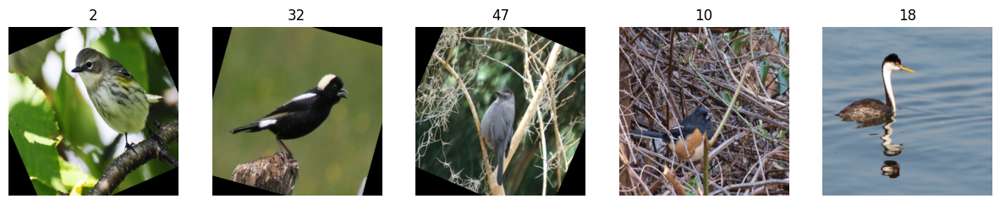

Epoch 13
Train Loss: 0.0018, Validation Loss: 0.1803, Validation Accuracy: 95.61%

Train Epoch 14 [0/295]	Loss: 0.000636
Train Epoch 14 [30/295]	Loss: 0.001666
Train Epoch 14 [60/295]	Loss: 0.002124
Train Epoch 14 [90/295]	Loss: 0.000914
Train Epoch 14 [120/295]	Loss: 0.006753
Train Epoch 14 [150/295]	Loss: 0.002127
Train Epoch 14 [180/295]	Loss: 0.000871
Train Epoch 14 [210/295]	Loss: 0.000832
Train Epoch 14 [240/295]	Loss: 0.001829
Train Epoch 14 [270/295]	Loss: 0.000843


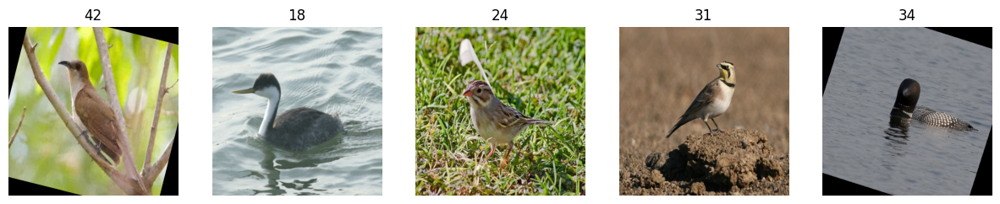

Epoch 14
Train Loss: 0.0022, Validation Loss: 0.1738, Validation Accuracy: 95.61%

[FINAL with Augmentation] Test Loss: 0.1977, Accuracy: 95.9732%
Best Accuracy: 96.28%
Elapsed Time: 1h, 48m, 6s
time: 1h, 108m, 6s


In [18]:
### Train/Evaluation ###
def train(model, train_loader, optimizer, epoch):
    model.train()
    for i, (image, target) in enumerate(train_loader):
        image, target = image.to(DEVICE), target.to(DEVICE)
        output = model(image)
        optimizer.zero_grad()
        train_loss = F.cross_entropy(output, target).to(DEVICE)
        train_loss.backward()
        optimizer.step()

        if i % 30 == 0:
            print(f'Train Epoch {epoch} [{i}/{len(train_loader)}]\tLoss: {train_loss.item():.6f}')
    return train_loss

def evaluate(model, val_loader):
    model.eval()
    eval_loss = 0
    correct = 0
    with torch.no_grad():
        for i, (image, target) in enumerate(val_loader):
            image, target = image.to(DEVICE), target.to(DEVICE)
            output = model(image)
            eval_loss += F.cross_entropy(output, target, reduction='sum').item()
            pred = output.max(1, keepdim=True)[1]
            correct += pred.eq(target.view_as(pred)).sum().item()
        eval_loss /= len(val_loader.dataset)
        eval_accuracy = 100 * correct / len(val_loader.dataset)
        return eval_loss, eval_accuracy

### Main ###
start = time.time()
best = 0
# best_without_augmentation = 0

### wandb ###
wandb.watch(model, log="all")
# wandb.watch(model_without_augmentation, log="all")

for epoch in range(EPOCH):
    # With Augmentation
    train_loss = train(model, train_loader, optimizer, epoch)
    val_loss, val_accuracy = evaluate(model, val_loader)

   # Logging for model with augmentation
    wandb.log({
        'epoch': epoch,
        'train_loss_with_aug': train_loss.item(),
        'val_loss_with_aug': val_loss,
        'val_accuracy_with_aug': val_accuracy
    })

    # Save best model
    if val_accuracy > best:
        best = val_accuracy
        torch.save(model.state_dict(), "./best_model_with_augmentation_resnet_d.pth")

    # augmentation 적용한 이미지 보기
    dataiter = iter(train_loader)
    images, labels = dataiter.__next__()
    fig, axes = plt.subplots(1, 5, figsize=(15, 5))
    for i in range(5):
      image = images[i].numpy().transpose((1, 2, 0))
      image = np.clip(image, 0, 1)
      axes[i].imshow(image)
      axes[i].set_title(labels[i].item())
      axes[i].axis('off')
    plt.show()
    scheduler.step()
    print(f'Epoch {epoch}')
    print(f"Train Loss: {train_loss.item():.4f}, Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%")
    # print(f"Without Augmentation - Train Loss: {train_loss_without_augmentation.item():.4f}, Validation Loss: {val_loss_without_augmentation:.4f}, Validation Accuracy: {val_accuracy_without_augmentation:.2f}%")
    print("")

# Test results
test_loss, test_accuracy = evaluate(model, test_loader)
# test_loss_without_augmentation, test_accuracy_without_augmentation = evaluate(model_without_augmentation, test_loader)

print(f'[FINAL with Augmentation] Test Loss: {test_loss:.4f}, Accuracy: {test_accuracy:.4f}%')
# print(f'[FINAL without Augmentation] Test Loss: {test_loss_without_augmentation:.4f}, Accuracy: {test_accuracy_without_augmentation:.4f}%')

end = time.time()
elasped_time = end - start
print(f"Best Accuracy: {best:.2f}%")
print(f"Elapsed Time: {int(elasped_time/3600)}h, {int((elasped_time%3600)/60)}m, {int(elasped_time%60)}s")
print(f"time: {int (elasped_time/3600)}h, {int(elasped_time/60)}m, {int(elasped_time%60)}s")

SGD, Adam, NAdam
( https://pytorch.org/docs/stable/generated/torch.optim.SGD.html )

1. Learning rate = 0.1, 0.01, 0.001
2. EPOCH = 5, 10, 15, 20, 25
3. Batch size = 8, 16, 32, 64, 128

# At SGD
4. momentum (defalut:0) = 0.9 ~

# At Adam (Adamw)
4. betas (Tuple[float, float], optional) – coefficients used for computing running averages of gradient and its square (default: (0.9, 0.999))
5. eps (float, optional) – term added to the denominator to improve numerical stability (default: 1e-8)

# At NAdam
4. betas (Tuple[float, float], optional) – coefficients used for computing running averages of gradient and its square (default: (0.9, 0.999))
5. eps (float, optional) – term added to the denominator to improve numerical stability (default: 1e-8)


In [19]:
!pip install grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 56.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.4.8-py3-none-any.whl size=38244 sha256=fe9faf16c7c75765f7e8114897b189ffb14bc24a0f65abf2aadc21cf5029b52c
  Stored in directory: /root/.cache/pip/wheels/f8/04/36/94ff3c8a4215826a21946b34c01180817e606989fdf53f7cd6
Successfully built grad-cam


35


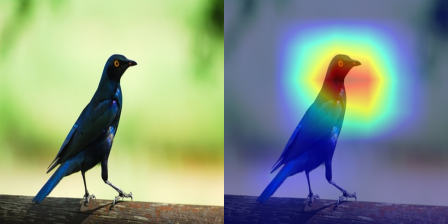

46


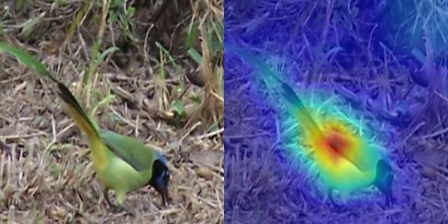

8


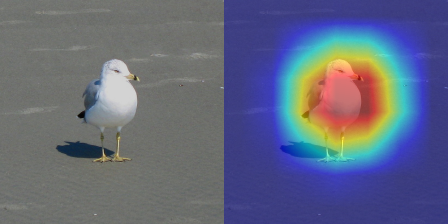

19


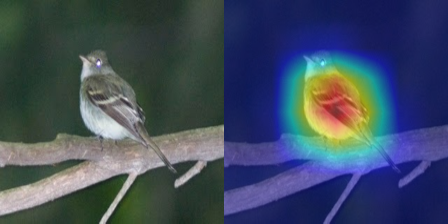

21


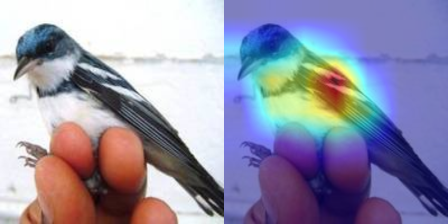

11


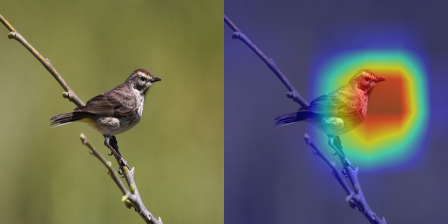

9


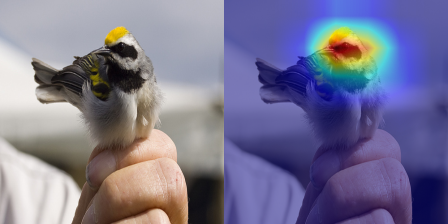

29


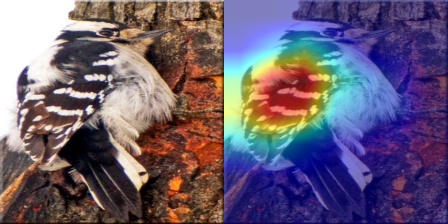

1


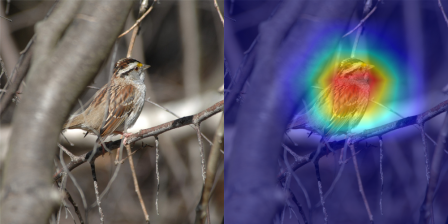

22


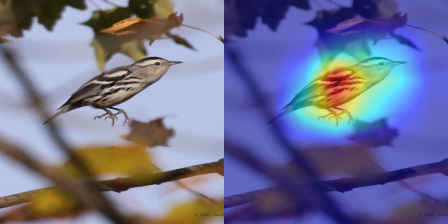

15


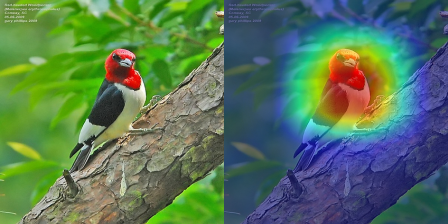

44


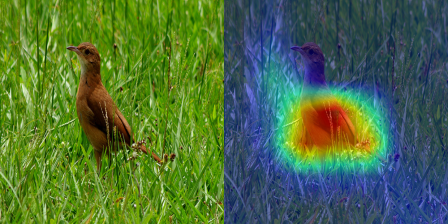

48


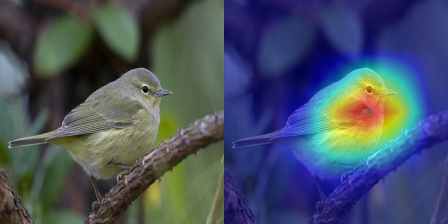

10


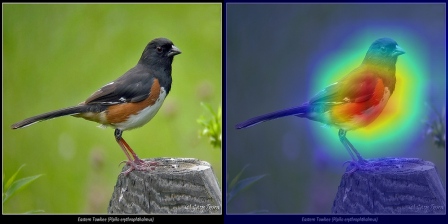

35


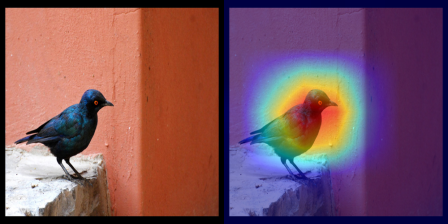

2


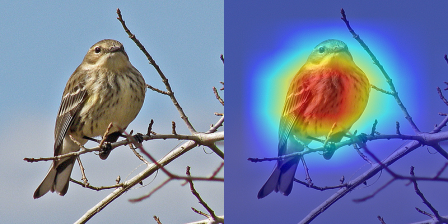

28


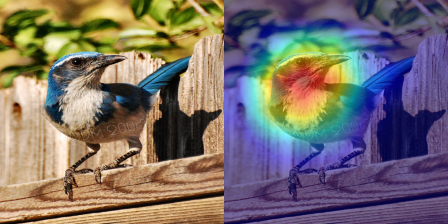

37


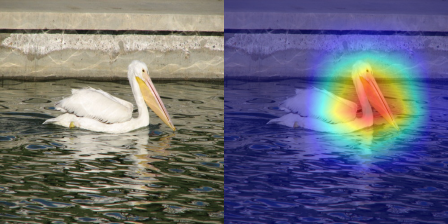

24


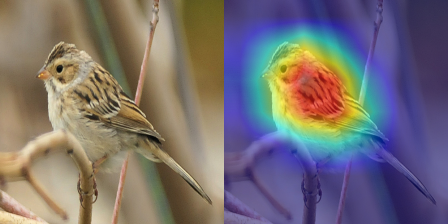

26


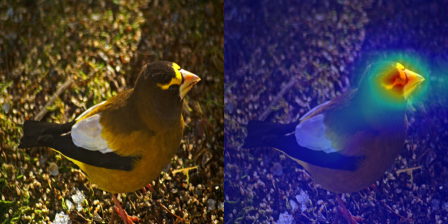

49


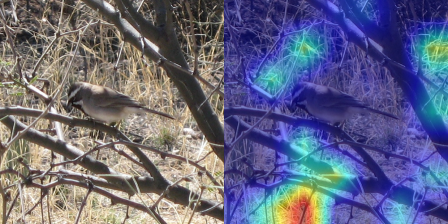

24


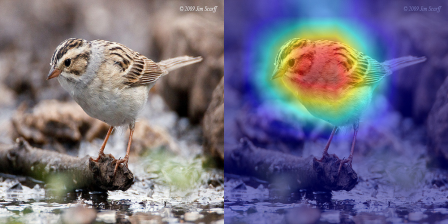

25


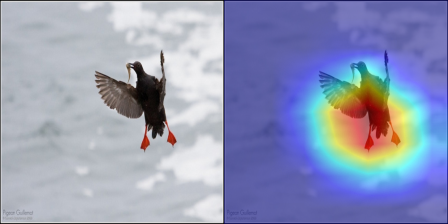

20


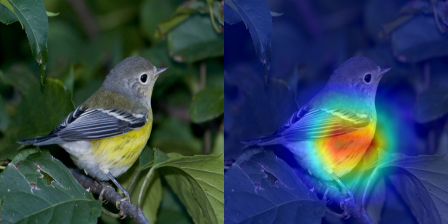

36


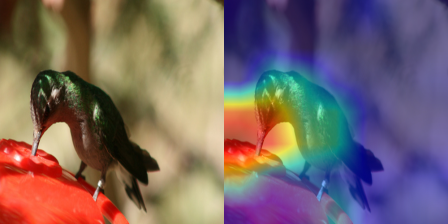

47


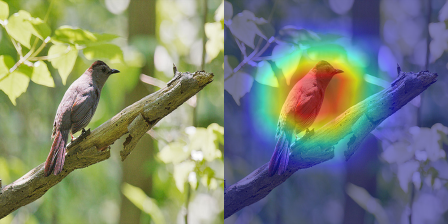

10


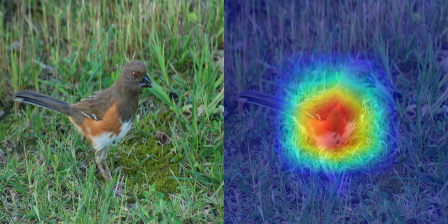

1


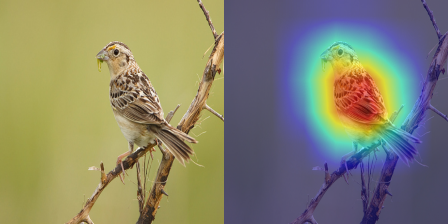

35


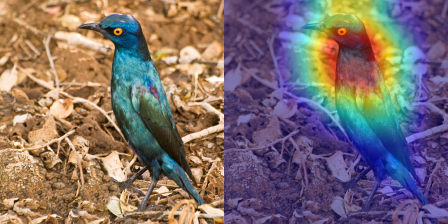

12


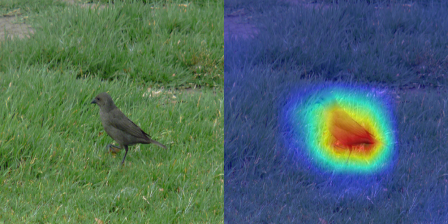

47


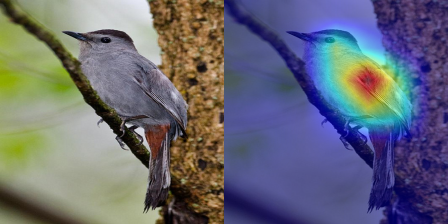

36


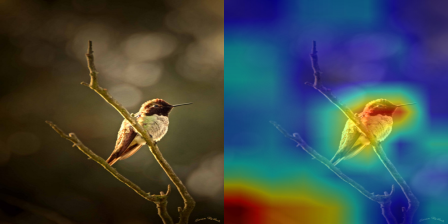

33


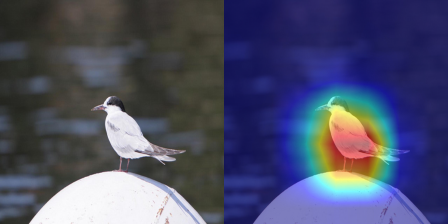

26


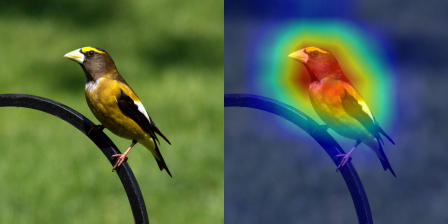

13


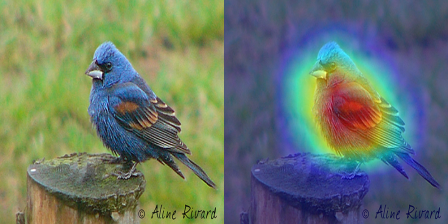

2


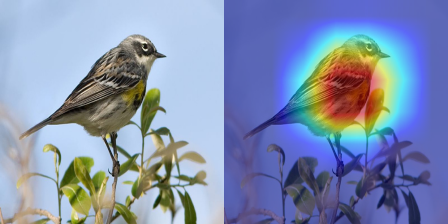

16


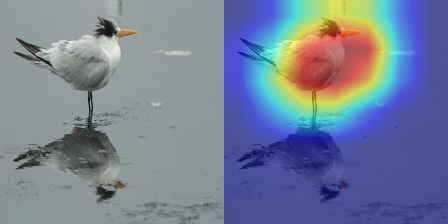

16


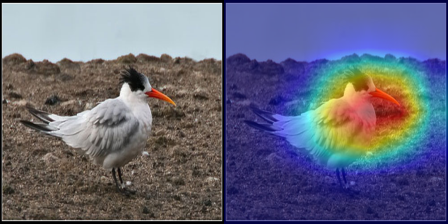

35


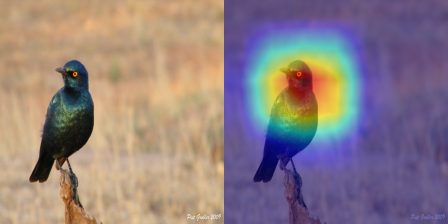

12


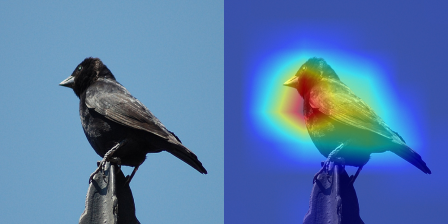

In [20]:
import warnings
warnings.filterwarnings('ignore')
from torchvision import models
import numpy as np
import cv2
import requests
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image, deprocess_image, preprocess_image
from PIL import Image
from google.colab.patches import cv2_imshow

model.eval()

def gradCAM(num):
  global model
  image_tensor, label = train_set_with_augmentation[num]
  print(label)
  img = image_tensor.permute(1, 2, 0).numpy()  # Convert tensor to NumPy array
  img = cv2.resize(img, (224, 224))
  input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
  targets = [ClassifierOutputTarget(label)]
  target_layers = [model.layer4[-1]]
  input_tensor = torch.Tensor(input_tensor).cuda()
  with GradCAM(model=model, target_layers=target_layers) as cam:
      grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
      cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
  cam = np.uint8(255*grayscale_cams[0, :])
  cam = cv2.merge([cam, cam])
  images = np.hstack((np.uint8(255*img), cam_image))
  Image.fromarray(images)

  images = cv2.cvtColor(images, cv2.COLOR_BGR2RGB)

  cv2_imshow(images)

for i in range(200):
  if i % 5 == 0:
    gradCAM(i)
